In [2]:
#Import the libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from wordcloud import WordCloud
import nltk
import re
import unicodedata
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
!pip install transformers

from transformers import pipeline
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV


from sklearn.naive_bayes import MultinomialNB

import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


import spacy
!python -m spacy download en_core_web_md


from sklearn.preprocessing import MinMaxScaler

#Tokenize and encode the data using the BERT tokenizer
from transformers import BertTokenizer, BertModel
import torch

from transformers import AutoTokenizer, AutoModel
from transformers import pipeline

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.5/33.5 MB 44.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [3]:
files = ['/content/Single_newsheadline_day_aapl.csv', '/content/Single_newsheadline_day_amt.csv',
         '/content/Single_newsheadline_day_atvi.csv', '/content/Single_newsheadline_day_bio.csv',
         '/content/Single_newsheadline_day_jnj.csv', '/content/Single_newsheadline_day_ndaq.csv', '/content/Single_newsheadline_day_nflx.csv',
         '/content/Single_newsheadline_day_nvda.csv', '/content/Single_newsheadline_day_pld.csv', '/content/Single_newsheadline_day_sbux.csv',
         '/content/Single_newsheadline_day_schw.csv', '/content/Single_newsheadline_day_tsla.csv']

In [4]:
single_headlines = []

for file in files:
  df = pd.read_csv(file)
  single_headlines.append(df)

merged_df = pd.concat(single_headlines, ignore_index=True)
merged_df.to_csv("single_headlines_merged_df.csv", index=False)

In [5]:
single_headlines_df = pd.read_csv('/content/single_headlines_merged_df.csv')
single_headlines_df.head()

,date,symbol,close,rsi,26-Day EMA,NextDayClose,Diff,Titles,filename
0,2021-01-05,aapl,131.009995,57.697283,3.371608,126.599998,0,Two former Apple insiders are building a laser...,headlinesIter0.csv
1,2021-01-06,aapl,126.599998,48.807969,3.229070,130.919998,1,NaN,headlinesIter1.csv
2,2021-01-07,aapl,130.919998,55.965116,3.089118,132.050003,1,Dow Jones Futures Rise: Congress Certifies Bid...,headlinesIter2.csv
3,2021-01-08,aapl,132.050003,57.633668,2.969111,128.979996,0,"The Best Mutual Funds Bet These Tech Stocks, I...",headlinesIter3.csv
4,2021-01-11,aapl,128.979996,51.881886,2.812149,128.800003,0,Short Selling Legend Jim Chanos’ Top 10 Stock ...,headlinesIter4.csv


In [6]:
single_headlines_df.tail()

,date,symbol,close,rsi,26-Day EMA,NextDayClose,Diff,Titles,filename
5081,2022-09-14,tsla,302.609985,58.547232,2.522179,303.750000,1,Fisker Hits a Major Milestone on Road to Affor...,headlinesIter406.csv
5082,2022-09-15,tsla,303.750000,59.083981,2.860867,303.350006,0,Tesla Is Exploring Building a Lithium Refining...,headlinesIter407.csv
5083,2022-09-16,tsla,303.350006,58.796310,3.227531,309.070007,1,10 EV Materials Stocks to Invest In,headlinesIter408.csv
5084,2022-09-19,tsla,309.070007,61.670319,3.676411,308.730011,0,This Bold Move Could Give Tesla an Edge in Bat...,headlinesIter409.csv
5085,2022-09-20,tsla,308.730011,61.396189,4.139489,300.799988,0,7 Battery Stocks That Could 10X by 2030,headlinesIter410.csv


In [7]:
single_headlines_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5086 entries, 0 to 5085
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          5086 non-null   object 
 1   symbol        5086 non-null   object 
 2   close         5086 non-null   float64
 3   rsi           5086 non-null   float64
 4   26-Day EMA    5086 non-null   float64
 5   NextDayClose  5086 non-null   float64
 6   Diff          5086 non-null   int64  
 7   Titles        5067 non-null   object 
 8   filename      5086 non-null   object 
dtypes: float64(4), int64(1), object(4)
memory usage: 357.7+ KB


In [8]:
def is_missing_values(df):
  print("Missing Values")
  missing_values = df.isnull().sum()
  return missing_values

missing_values = is_missing_values(single_headlines_df)
print(missing_values)

Missing Values
date             0
symbol           0
close            0
rsi              0
26-Day EMA       0
NextDayClose     0
Diff             0
Titles          19
filename         0
dtype: int64


In [9]:
def remove_missing_values(df):
  df = df.dropna()
  return df

single_headlines_df1 = remove_missing_values(single_headlines_df)
missing_values = is_missing_values(single_headlines_df1)
print(missing_values)
print(single_headlines_df1)

Missing Values
date            0
symbol          0
close           0
rsi             0
26-Day EMA      0
NextDayClose    0
Diff            0
Titles          0
filename        0
dtype: int64
            date symbol       close        rsi  26-Day EMA  NextDayClose  \
0     2021-01-05   aapl  131.009995  57.697283    3.371608    126.599998   
2     2021-01-07   aapl  130.919998  55.965116    3.089118    132.050003   
3     2021-01-08   aapl  132.050003  57.633668    2.969111    128.979996   
4     2021-01-11   aapl  128.979996  51.881886    2.812149    128.800003   
5     2021-01-12   aapl  128.800003  51.557013    2.630971    130.889999   
...          ...    ...         ...        ...         ...           ...   
5081  2022-09-14   tsla  302.609985  58.547232    2.522179    303.750000   
5082  2022-09-15   tsla  303.750000  59.083981    2.860867    303.350006   
5083  2022-09-16   tsla  303.350006  58.796310    3.227531    309.070007   
5084  2022-09-19   tsla  309.070007  61.670319    

#Cleaning the data in much more detail

• Converting the sequence of words to lowercase

• Removal of stop words. Stop words refers to a group
of words that are commonly used in a language. Some
of the stop words used in the English language are “a”,
“the”, “are”, “is”, etc. Since these words carry very little
information, removing them would not affect the overall
context of the sentence

• Removing punctuation and other special characters

• Lemmatization: It refers to the process of
converting the words to their root form or base form

In [10]:
# Download the 'punkt_tab' data package
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('punkt_tab') # Download punkt_tab
nltk.download('wordnet') # Download wordnet


def clean_text(text):
    # Convert to lowercase
    text = text.lower()

    # Normalize unicode characters and remove all punctuation
    text = ''.join(
        ch for ch in unicodedata.normalize('NFKD', text)
        if not unicodedata.category(ch).startswith('P')
    )

    # Tokenize
    tokens = nltk.word_tokenize(text)

    # Remove stop words
    stop_words = set(stopwords.words('english'))
    tokens = [w for w in tokens if w not in stop_words]

    # Stemming (don't do it because you want to retain the word)
    # stemmer = PorterStemmer()
    # tokens = [stemmer.stem(w) for w in tokens]

    #Lemmization (Accuracy and context are crucial)
    lemmatizer = nltk.WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(w) for w in tokens]

    return " ".join(tokens)

# Apply the cleaning function to the 'headline' column
single_headlines_df1['Cleaned_titles'] = single_headlines_df1['Titles'].apply(clean_text)

print(single_headlines_df1[['Titles', 'Cleaned_titles']].head())

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


                                              Titles  \
0  Two former Apple insiders are building a laser...   
2  Dow Jones Futures Rise: Congress Certifies Bid...   
3  The Best Mutual Funds Bet These Tech Stocks, I...   
4  Short Selling Legend Jim Chanos’ Top 10 Stock ...   
5  The World’s Top Maker of Mini Motors Bets It C...   

                                      Cleaned_titles  
0  two former apple insider building laser techno...  
2  dow jones future rise congress certifies biden...  
3   best mutual fund bet tech stock ipo keep running  
4  short selling legend jim chanos top 10 stock p...  
5           world top maker mini motor bet win tesla  


<ipython-input-10-69ad47b4380e>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  single_headlines_df1['Cleaned_titles'] = single_headlines_df1['Titles'].apply(clean_text)


# **What to do:**
- Compare different feature representations
Standard text processing (frequencies, bigram, etc.), TF-IDF, DistilBERT, T5, etc.

- Huggingface repo:
distilbert-base-uncased.png
distilbert/distilbert-base-uncased · Hugging Face
huggingface.co

- Pipeline seen in class to extract vectors:
Week 11 > NLP > In-class exercise

- Classification step: Compare RF, SVM with Bi-LSTM
Sentiment-Analysis-scaled.jpg
Sentiment Analysis Using Bidirectional Stacked LSTM
analyticsvidhya.com

- Paper comparing embeddings:
IEEE Xplore Full-Text PDF:
ieeexplore.ieee.org
Image


# HuggingFace (Text Sentiment Analysis) with Hugging Face Transformers

Our Transformer based model looks like and how it is fine-tuned, we have sufficient context for implementing a pipeline with Sentiment Analysis with Python.

In [11]:
#try sentiment analysis and skip the nan for exception
sentimentanalyzer = pipeline("sentiment-analysis")

# Assuming 'single_headlines_df' is your DataFrame and 'headline' is the column containing the headlines
sentiment_scores = []
sentiment_labels = []

for index, row in single_headlines_df1.iterrows():
    try:
        # print(row['Titles'])
        # print(type(row['Titles']))
        # print(len(row['Titles']))
        result = sentimentanalyzer(row['Titles'])
        sentiment_scores.append(result[0]['score'])
        sentiment_labels.append(result[0]['label'])
    except Exception as e:
        print(f"Error processing headline at index {index}: {e}")
        sentiment_scores.append(None)  # Or handle the error as needed
        sentiment_labels.append(None)

single_headlines_df1['sentiment_score'] = sentiment_scores
single_headlines_df1['sentiment_label'] = sentiment_labels

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision 714eb0f (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

Device set to use cuda:0
You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
<ipython-input-11-7bc3eec39b65>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  single_headlines_df1['sentiment_score'] = sentiment_scores
<ipython-input-11-7bc3eec39b65>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  single_headlines_df1['sentiment_label'] = sentiment_labels


In [12]:
single_headlines_df1.head()

,date,symbol,close,rsi,26-Day EMA,NextDayClose,Diff,Titles,filename,Cleaned_titles,sentiment_score,sentiment_label
0,2021-01-05,aapl,131.009995,57.697283,3.371608,126.599998,0,Two former Apple insiders are building a laser...,headlinesIter0.csv,two former apple insider building laser techno...,0.985145,POSITIVE
2,2021-01-07,aapl,130.919998,55.965116,3.089118,132.050003,1,Dow Jones Futures Rise: Congress Certifies Bid...,headlinesIter2.csv,dow jones future rise congress certifies biden...,0.992537,POSITIVE
3,2021-01-08,aapl,132.050003,57.633668,2.969111,128.979996,0,"The Best Mutual Funds Bet These Tech Stocks, I...",headlinesIter3.csv,best mutual fund bet tech stock ipo keep running,0.997731,POSITIVE
4,2021-01-11,aapl,128.979996,51.881886,2.812149,128.800003,0,Short Selling Legend Jim Chanos’ Top 10 Stock ...,headlinesIter4.csv,short selling legend jim chanos top 10 stock p...,0.982417,NEGATIVE
5,2021-01-12,aapl,128.800003,51.557013,2.630971,130.889999,1,The World’s Top Maker of Mini Motors Bets It C...,headlinesIter5.csv,world top maker mini motor bet win tesla,0.987533,POSITIVE


In [13]:
single_headlines_df1.tail()

,date,symbol,close,rsi,26-Day EMA,NextDayClose,Diff,Titles,filename,Cleaned_titles,sentiment_score,sentiment_label
5081,2022-09-14,tsla,302.609985,58.547232,2.522179,303.750000,1,Fisker Hits a Major Milestone on Road to Affor...,headlinesIter406.csv,fisker hit major milestone road affordable ev,0.999102,POSITIVE
5082,2022-09-15,tsla,303.750000,59.083981,2.860867,303.350006,0,Tesla Is Exploring Building a Lithium Refining...,headlinesIter407.csv,tesla exploring building lithium refining plan...,0.979021,POSITIVE
5083,2022-09-16,tsla,303.350006,58.796310,3.227531,309.070007,1,10 EV Materials Stocks to Invest In,headlinesIter408.csv,10 ev material stock invest,0.956632,POSITIVE
5084,2022-09-19,tsla,309.070007,61.670319,3.676411,308.730011,0,This Bold Move Could Give Tesla an Edge in Bat...,headlinesIter409.csv,bold move could give tesla edge battery produc...,0.998969,POSITIVE
5085,2022-09-20,tsla,308.730011,61.396189,4.139489,300.799988,0,7 Battery Stocks That Could 10X by 2030,headlinesIter410.csv,7 battery stock could 10x 2030,0.990406,NEGATIVE


In [14]:
positive_count = (single_headlines_df1['sentiment_label'] == 'POSITIVE').sum()
negative_count = (single_headlines_df1['sentiment_label'] == 'NEGATIVE').sum()
neutral_count = (single_headlines_df1['sentiment_label'] == 'NEUTRAL').sum()

print("Positive Count:", positive_count)
print("Negative Count:", negative_count)
print("Neutral Count:", neutral_count)

Positive Count: 2762
Negative Count: 2305
Neutral Count: 0


Text(0.5, 1.0, 'Sentiment Analysis Counts')

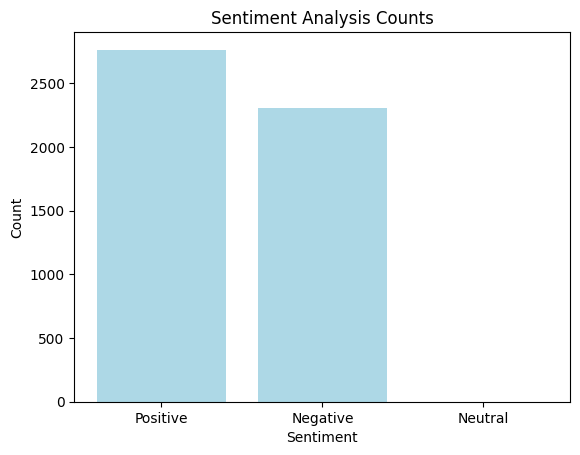

In [15]:
#plot the counts as a barchat
labels = ['Positive', 'Negative', 'Neutral']
counts = [positive_count, negative_count, neutral_count]
color = ['lightblue', 'lightblue', 'lightblue']

plt.bar(labels, counts, color = color)
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.title('Sentiment Analysis Counts')

<ipython-input-16-09cfd0ef1208>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  single_headlines_df1['year'] = pd.to_datetime(single_headlines_df1['date']).dt.year


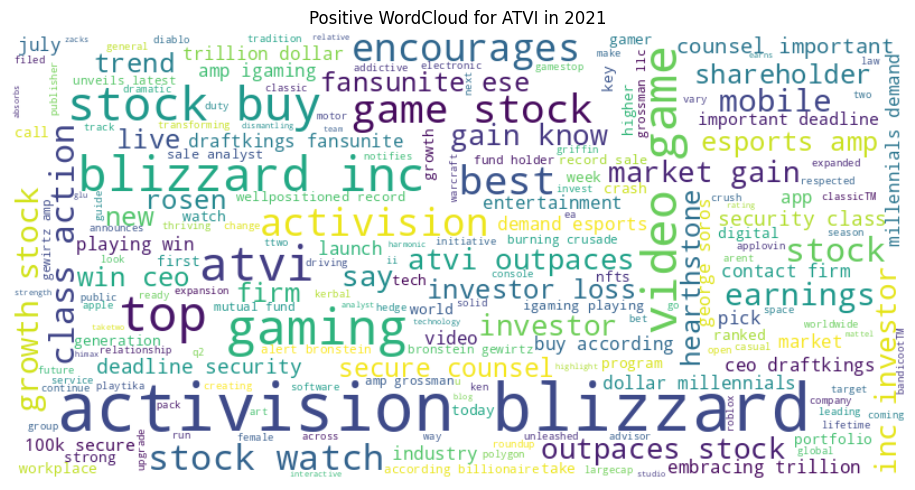

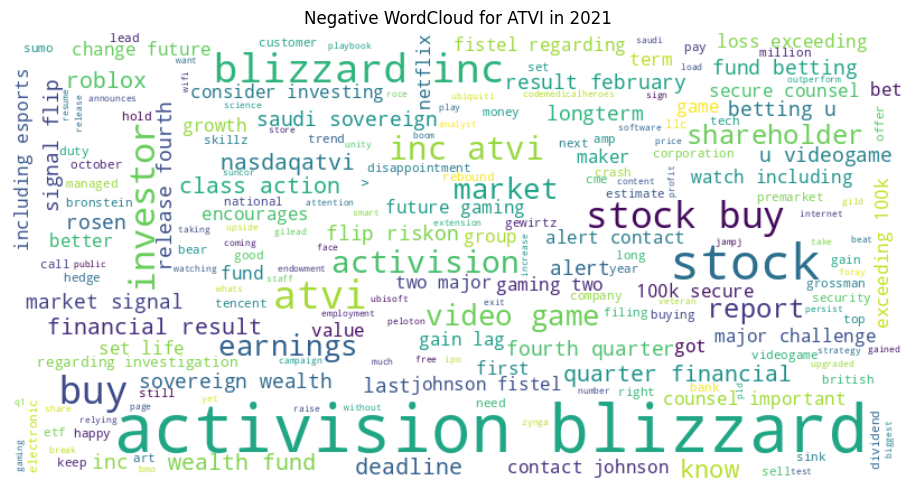

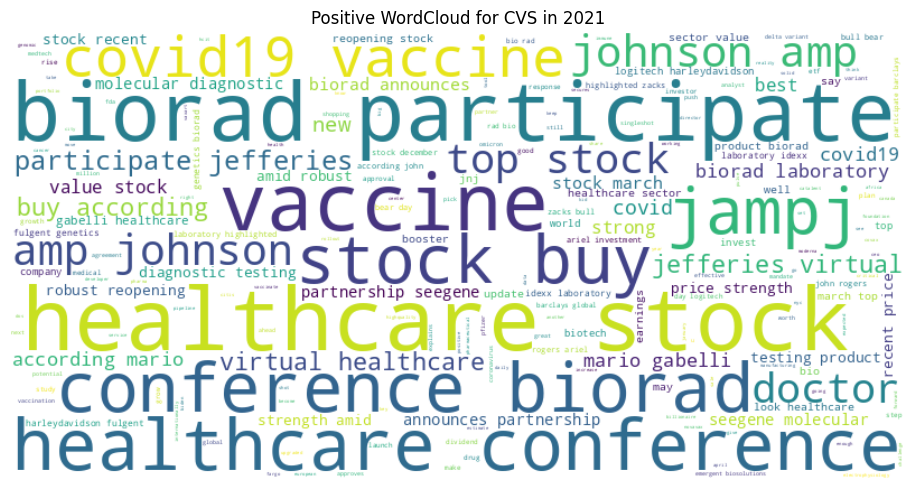

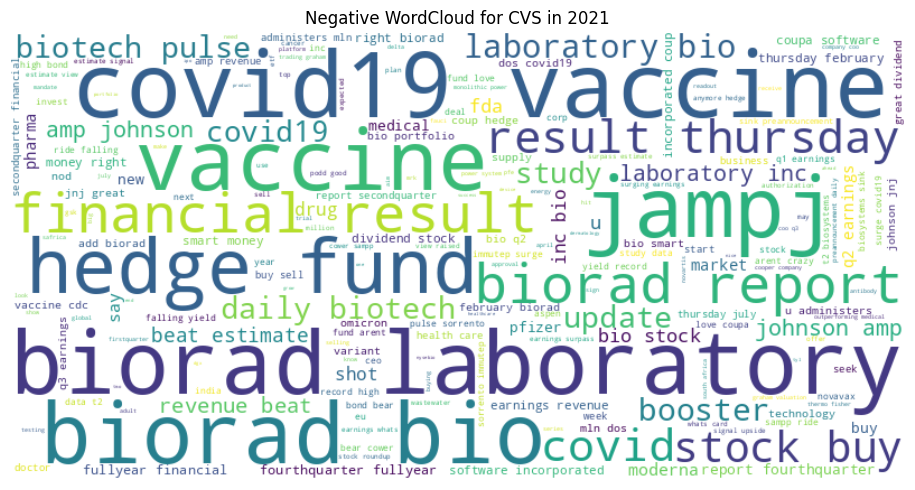

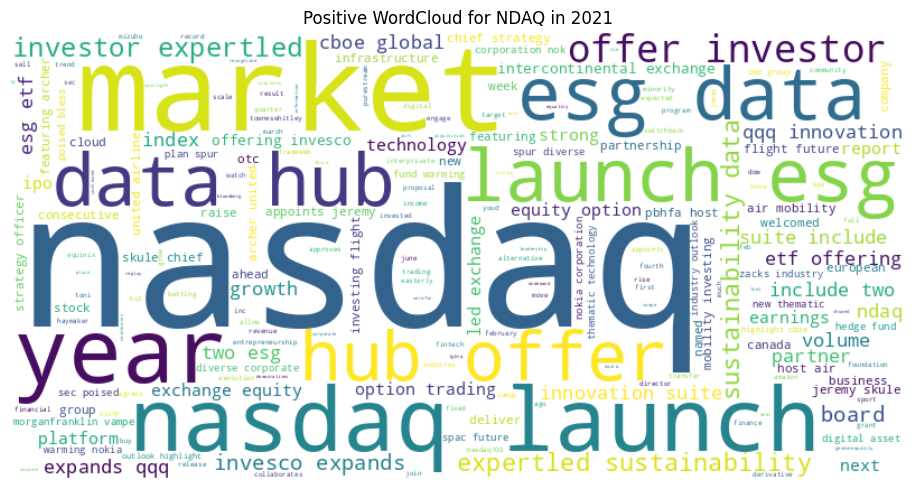

...

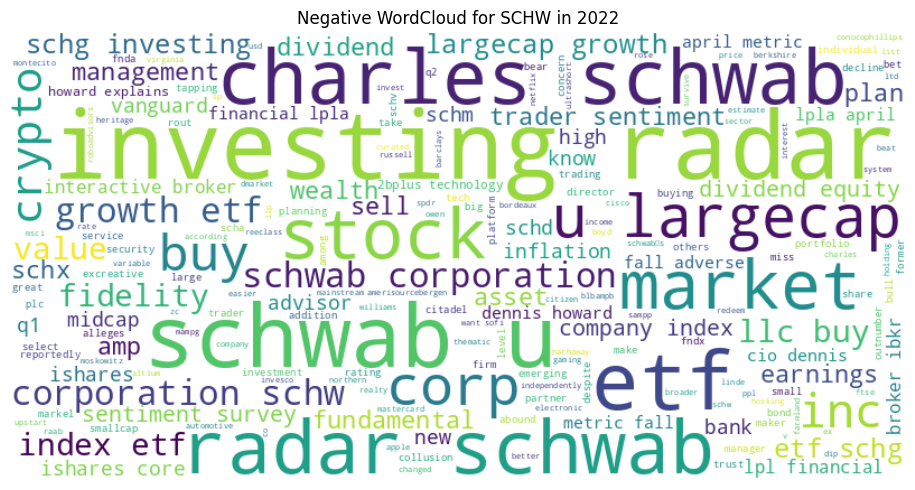

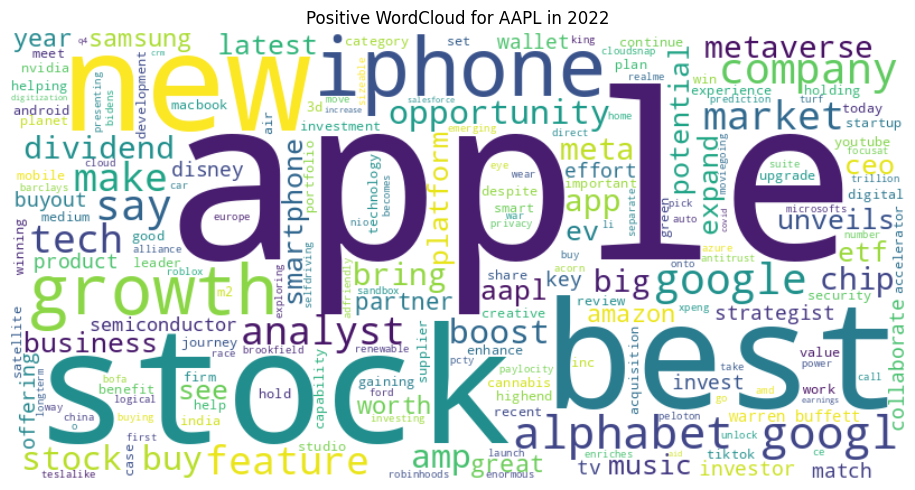

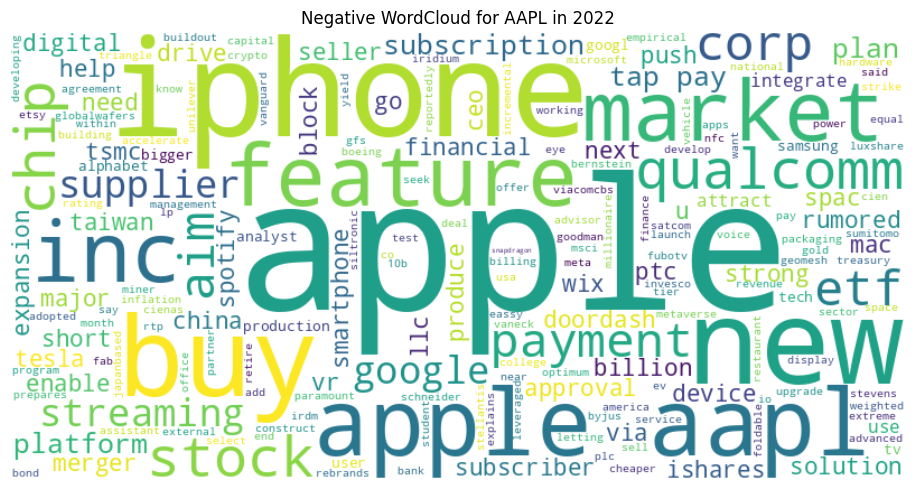

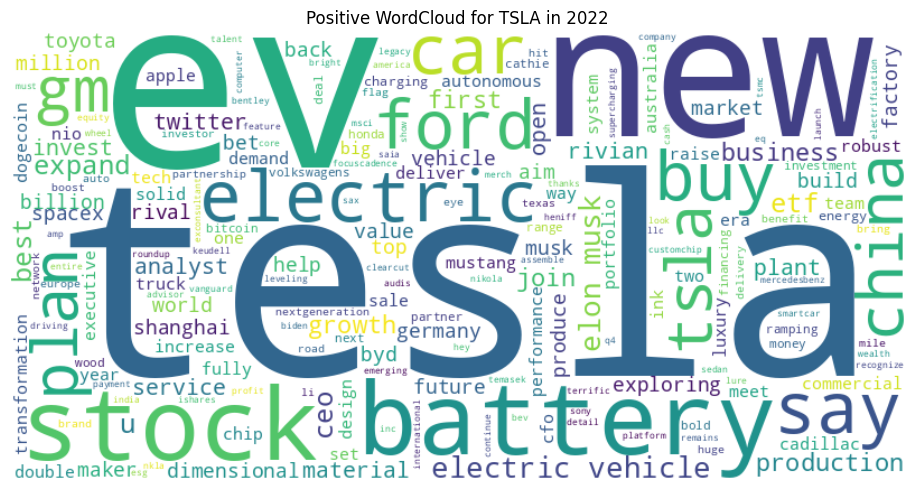

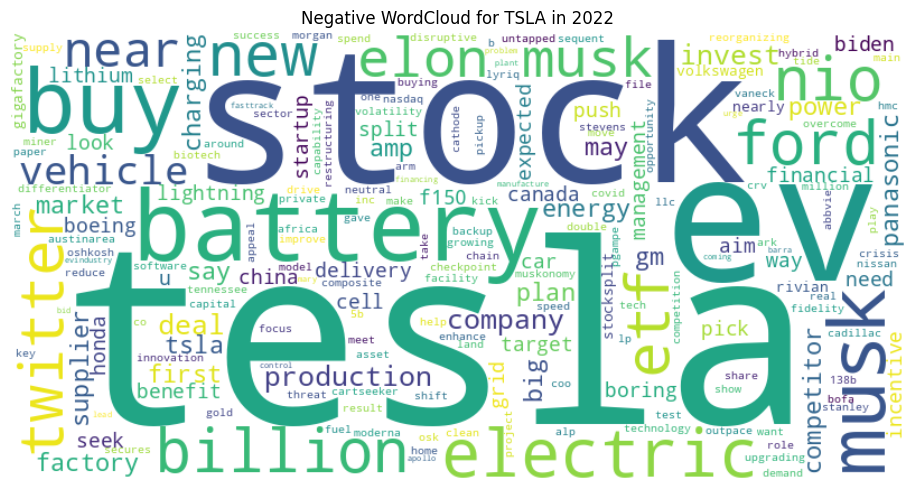

In [16]:
# Ensure 'year' column exists
single_headlines_df1['year'] = pd.to_datetime(single_headlines_df1['date']).dt.year

# Filter only POSITIVE and NEGATIVE
filtered_df = single_headlines_df1[single_headlines_df1['sentiment_label'].isin(['POSITIVE', 'NEGATIVE'])]

# Generate wordcloud
def generate_wordcloud(text_list, title):
    all_text = ' '.join(text_list)
    if not all_text.strip():
        return
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Group by year and symbol, and generate wordclouds per sentiment
grouped = filtered_df.groupby(['year', 'symbol'])

for (year, symbol), group in grouped:
    for sentiment in ['POSITIVE', 'NEGATIVE']:
        sentiment_group = group[group['sentiment_label'] == sentiment]
        titles = sentiment_group['Cleaned_titles'].dropna().astype(str).tolist()
        generate_wordcloud(titles, f'{sentiment.capitalize()} WordCloud for {symbol.upper()} in {year}')


In [17]:
# want to split the data into training, validation and testing sets
# Split data into training and temporary sets (60% train, 40% temp)
train_df, temp_df = train_test_split(single_headlines_df1, test_size = 0.4, random_state = 42)
# Split temporary data into validation and testing sets (50% validation, 50% testing)
val_df, test_df = train_test_split(temp_df, test_size = 0.5, random_state = 42)

print("Training set shape:", train_df.shape)
print("Validation set shape:", val_df.shape)
print("Testing set shape:", test_df.shape)

Training set shape: (3040, 13)
Validation set shape: (1013, 13)
Testing set shape: (1014, 13)


In [18]:
# Features = Cleaned_titles; Target = sentiment_label
X_train = train_df['Cleaned_titles']
y_train = train_df['sentiment_label']

X_val = val_df['Cleaned_titles']
y_val = val_df['sentiment_label']

X_test = test_df['Cleaned_titles']
y_test = test_df['sentiment_label']


print("Train:", (X_train.shape,y_train.shape), "Val:", (X_val.shape, y_val.shape), "Test:",(X_test.shape,y_test.shape))

Train: ((3040,), (3040,)) Val: ((1013,), (1013,)) Test: ((1014,), (1014,))


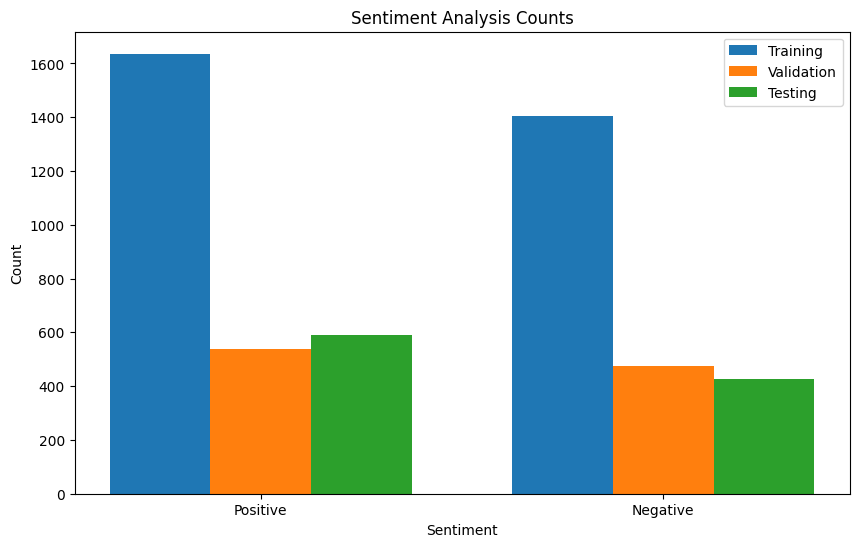

In [19]:
#plot a stack bar chart the postive and negative sentiment for training, validation and testing set

positive_count_train = (train_df['sentiment_label'] == 'POSITIVE').sum()
negative_count_train = (train_df['sentiment_label'] == 'NEGATIVE').sum()

positive_count_val = (val_df['sentiment_label'] == 'POSITIVE').sum()
negative_count_val = (val_df['sentiment_label'] == 'NEGATIVE').sum()

positive_count_test = (test_df['sentiment_label'] == 'POSITIVE').sum()
negative_count_test = (test_df['sentiment_label'] == 'NEGATIVE').sum()


data_sentiment_counts = {'Training': [positive_count_train, negative_count_train],
        'Validation': [positive_count_val, negative_count_val],
        'Testing': [positive_count_test, negative_count_test]}

sentiment_labels = ['Positive', 'Negative']

# Convert the dictionary to a list of lists for plotting
data_to_plot = [data_sentiment_counts[dataset] for dataset in data_sentiment_counts]

# Get the dataset labels (Training, Validation, Testing)
dataset_labels = list(data_sentiment_counts.keys())

# Set the width of each bar
bar_width = 0.25

# Calculate the x-axis positions for each bar group
x_pos = np.arange(len(sentiment_labels))

# Create the stacked bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each dataset's bars with appropriate offsets
for i, dataset in enumerate(dataset_labels):
    ax.bar(x_pos + i * bar_width, data_to_plot[i], width=bar_width, label=dataset)

# Set x-axis labels and ticks
ax.set_xticks(x_pos + bar_width)  # Center the ticks under the bar groups
ax.set_xticklabels(sentiment_labels)

# Set labels and title
ax.set_xlabel('Sentiment')
ax.set_ylabel('Count')
ax.set_title('Sentiment Analysis Counts')

# Add a legend
ax.legend()

# Show the plot
plt.show()

# TF-IDF feature representation

Feature Extraction
TF-IDF: It is a method of extracting the features from the text data. TF stands for Term Frequency and IDF stands for Inverse Document Frequency.

In [20]:
vectorizer= TfidfVectorizer()
tf_x_train = vectorizer.fit_transform(X_train)
tf_x_val = vectorizer.transform(X_val)
tf_x_test = vectorizer.transform(X_test)

## Classification step: Compare RF, SVM, Naives Bayes + TF-IDF and Bi-LSTM

- TF-IDF + RF
  - Model fine-tuning (GridSearchCV needed)
- TF-IDF + SVM
  - Model fine-tuning (GridSearchCV needed)
- TF-IDF + Naive Bayes
  - Model fine-tuning (GridSearchCV needed)
- Bidirectional Stacked LSTM
  - Stacked LSTM for learning deeper, more complex patterns in sequential data.
Bidirectional LSTM for multi-class classification using both past and future context.
  - Bidirectional LSTMs process input sequences in both forward and backward directions, allowing the model to capture information from both past and future contexts. This can significantly improve performance on tasks where context from both directions is important, such as text classification.
  - Reference: https://www.geeksforgeeks.org/bidirectional-lstm-in-nlp/

In [21]:

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}

# Initialize Random Forest
rf_classifier = RandomForestClassifier(random_state=42)

# Wrap with GridSearchCV
grid_search = GridSearchCV(
    estimator=rf_classifier,
    param_grid=param_grid,
    cv=3,  # 3-fold cross-validation
    scoring='accuracy',
    verbose=2,
    n_jobs=-1  # use all CPU cores
)

# Fit on training data
grid_search.fit(tf_x_train, y_train)

# Best model
best_rf = grid_search.best_estimator_

# Predict on test data
y_test_pred = best_rf.predict(tf_x_test)

# Evaluate
accuracy = accuracy_score(y_test, y_test_pred)
print("Best Parameters:", grid_search.best_params_)
print("Test Accuracy:", accuracy)
print(classification_report(y_test, y_test_pred))

Fitting 3 folds for each of 96 candidates, totalling 288 fits
Best Parameters: {'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Test Accuracy: 0.7731755424063116
              precision    recall  f1-score   support

    NEGATIVE       0.74      0.70      0.72       425
    POSITIVE       0.79      0.82      0.81       589

    accuracy                           0.77      1014
   macro avg       0.77      0.76      0.77      1014
weighted avg       0.77      0.77      0.77      1014



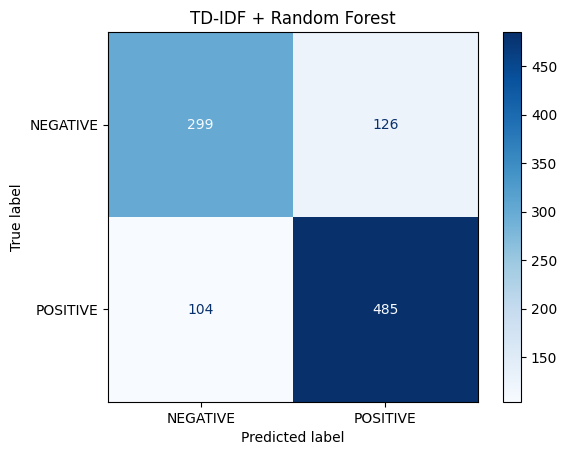

In [22]:
cm = confusion_matrix(y_test, y_test_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_rf.classes_)
disp.plot(cmap=plt.cm.Blues)
disp.ax_.set_title("TD-IDF + Random Forest")
plt.show()

In [23]:
# Parameter grid to search
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],  # Linear and RBF kernels
    'gamma': ['scale', 'auto']   # Only relevant for RBF
}

# Initialize the base SVC model
svm_classifier = SVC(random_state=42)

# Wrap with GridSearchCV
grid_search = GridSearchCV(
    estimator=svm_classifier,
    param_grid=param_grid,
    scoring='accuracy',
    cv=3,           # 3-fold cross-validation
    verbose=2,
    n_jobs=-1       # use all CPU cores
)

# Fit to training data
grid_search.fit(tf_x_train, y_train)

# Get best model
best_svm = grid_search.best_estimator_

# Predict on test set
y_test_pred = best_svm.predict(tf_x_test)

# Evaluate
accuracy = accuracy_score(y_test, y_test_pred)
print("Best Parameters:", grid_search.best_params_)
print("Test Accuracy:", accuracy)
print(classification_report(y_test, y_test_pred))


Fitting 3 folds for each of 12 candidates, totalling 36 fits
Best Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Test Accuracy: 0.8175542406311637
              precision    recall  f1-score   support

    NEGATIVE       0.80      0.75      0.77       425
    POSITIVE       0.83      0.87      0.85       589

    accuracy                           0.82      1014
   macro avg       0.82      0.81      0.81      1014
weighted avg       0.82      0.82      0.82      1014



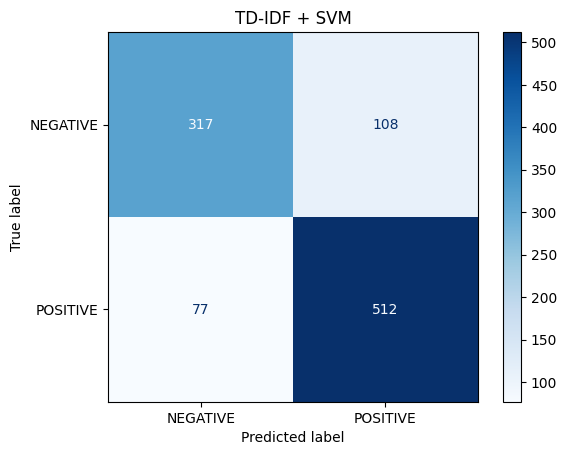

In [24]:
# ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_test_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_svm.classes_)
disp.plot(cmap=plt.cm.Blues)
disp.ax_.set_title("TD-IDF + SVM")
plt.show()

In [25]:
# Parameter grid for smoothing parameter alpha
param_grid = {
    'alpha': [0.1, 0.5, 1.0, 2.0, 5.0],
    'fit_prior': [True, False]
}

# Initialize the base Naive Bayes model
nb_classifier = MultinomialNB()

# Wrap with GridSearchCV
grid_search = GridSearchCV(
    estimator=nb_classifier,
    param_grid=param_grid,
    scoring='accuracy',
    cv=3,            # 3-fold cross-validation
    verbose=2,
    n_jobs=-1        # Use all CPU cores
)

# Fit to training data
grid_search.fit(tf_x_train, y_train)

# Get best model
best_nb = grid_search.best_estimator_

# Predict on test set
y_test_pred = best_nb.predict(tf_x_test)

# Evaluate
accuracy = accuracy_score(y_test, y_test_pred)
print("Best Parameters:", grid_search.best_params_)
print("Test Accuracy:", accuracy)
print(classification_report(y_test, y_test_pred))


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Parameters: {'alpha': 0.5, 'fit_prior': True}
Test Accuracy: 0.7840236686390533
              precision    recall  f1-score   support

    NEGATIVE       0.80      0.65      0.72       425
    POSITIVE       0.78      0.88      0.83       589

    accuracy                           0.78      1014
   macro avg       0.79      0.77      0.77      1014
weighted avg       0.79      0.78      0.78      1014



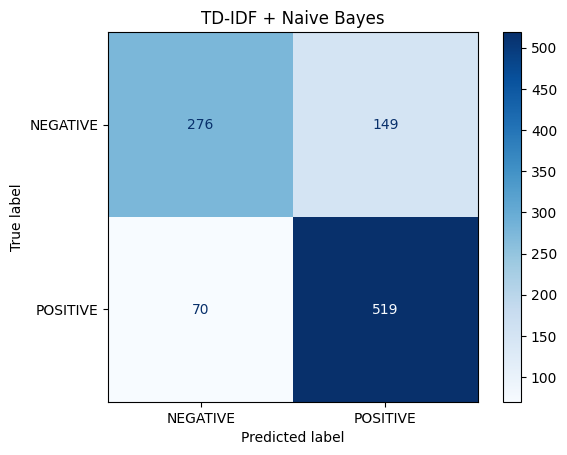

In [26]:
cm = confusion_matrix(y_test, y_test_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_nb.classes_)
disp.plot(cmap=plt.cm.Blues)
disp.ax_.set_title("TD-IDF + Naive Bayes")
plt.show()

In [27]:
# Bidirectional Stacked LSTM - dont use the tf_x_train = vectorizer.fit_transform(X_train), tf_x_val = vectorizer.transform(X_val), tf_x_test = vectorizer.transform(X_test)
# The error arises because the tokenizer.texts_to_sequences method in Keras expects a list of strings as input,
# I was providing it with tf_x_train, which is a sparse matrix of type csr_matrix representing the TF-IDF features. Internally, texts_to_sequences tries to apply the lower() method to each element,
# but sparse matrices do not have this attribute, hence the AttributeError: 'csr_matrix' object has no attribute 'lower'.

#Tokenization - Out Of Vocab token - this will replace any unknown words with a token of our choosing

tokenizer = Tokenizer(oov_token="<OOV>")
tokenizer.fit_on_texts(X_train)

#Convert texts to sequences
X_train_seq = tokenizer.texts_to_sequences(X_train)
X_val_seq = tokenizer.texts_to_sequences(X_val)
X_test_seq = tokenizer.texts_to_sequences(X_test)

#Padding
max_sequence_len = max(len(x) for x in X_train_seq)
X_train_pad = pad_sequences(X_train_seq, maxlen = max_sequence_len, padding = 'post')
X_val_pad = pad_sequences(X_val_seq, maxlen = max_sequence_len, padding = 'post')
X_test_pad = pad_sequences(X_test_seq, maxlen = max_sequence_len, padding = 'post')

#Vocabulary size
vocab_size = len(tokenizer.word_index) + 1

# Convert sentiment labels to numerical values before calling build_model
label_mapping = {"POSITIVE": 2, "NEGATIVE": 1, "NEUTRAL": 0}  # Example mapping
y_train_encoded = [label_mapping[label] for label in y_train]
y_val_encoded = [label_mapping[label] for label in y_val]
y_test_encoded = [label_mapping[label] for label in y_test]

In [28]:
# Basic Training Logic
def train_model(model, lr):
    model.compile(
        optimizer=Adam(learning_rate=lr),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    history = model.fit(
        tf.convert_to_tensor(X_train_pad), tf.convert_to_tensor(y_train_encoded),
        validation_data=(tf.convert_to_tensor(X_val_pad), tf.convert_to_tensor(y_val_encoded)),
        epochs=5, #faster to run
        callbacks=[
            EarlyStopping(monitor='val_loss', patience=3),
            ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=1)
        ],
        verbose=0
    )

    return history  # Full history for plotting

In [29]:
def plot_history(history, title="Model"):
    history_dict = history.history
    acc = history_dict['accuracy']
    val_acc = history_dict['val_accuracy']
    loss = history_dict['loss']
    val_loss = history_dict['val_loss']

    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.plot(acc, label='Train Accuracy')
    plt.plot(val_acc, label='Val Accuracy')
    plt.title(f'{title}: Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(loss, label='Train Loss')
    plt.plot(val_loss, label='Val Loss')
    plt.title(f'{title}: Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [30]:
#Model A: Small, Dropout

def model_A():
    model = Sequential([
        Embedding(input_dim=vocab_size, output_dim=32, input_length=max_sequence_len),
        Bidirectional(LSTM(32, return_sequences=True)),
        Dropout(0.2),
        Bidirectional(LSTM(16)),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dropout(0.1),
        Dense(3, activation='softmax')  # 3 classes
    ])
    history = train_model(model, lr=0.01)
    plot_history(history, title="Model A")
    return history


In [31]:
# Model B: Medium, No Dropout
def model_B():
    model = Sequential([
        Embedding(input_dim=vocab_size, output_dim=64, input_length=max_sequence_len),
        Bidirectional(LSTM(64, return_sequences=True)),
        Bidirectional(LSTM(32)),
        Dense(64, activation='relu'),
        Dense(3, activation='softmax')
    ])
    history = train_model(model, lr=0.01)
    plot_history(history, title="Model B")
    return history


In [32]:
# Model C: Large, Dropout

def model_C():
    model = Sequential([
        Embedding(input_dim=vocab_size, output_dim=128, input_length=max_sequence_len),
        Bidirectional(LSTM(64, return_sequences=True)),
        Dropout(0.2),
        Bidirectional(LSTM(32)),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dropout(0.1),
        Dense(3, activation='softmax')
    ])
    history = train_model(model, lr=0.01)
    plot_history(history, title="Model C")
    return history


In [33]:
# Model D: Medium, Balanced
def model_D():
    model = Sequential([
        Embedding(input_dim=vocab_size, output_dim=64, input_length=max_sequence_len),
        Bidirectional(LSTM(32, return_sequences=True)),
        Dropout(0.2),
        Bidirectional(LSTM(16)),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dropout(0.1),
        Dense(3, activation='softmax')
    ])
    history = train_model(model, lr=0.01)
    plot_history(history, title="Model D")
    return history

In [34]:
# Model E: Deep, No Dropout
def model_E():
    model = Sequential([
        Embedding(input_dim=vocab_size, output_dim=64, input_length=max_sequence_len),
        Bidirectional(LSTM(64, return_sequences=True)),
        Bidirectional(LSTM(64)),
        Dense(64, activation='relu'),
        Dense(3, activation='softmax')
    ])
    history = train_model(model, lr=0.01)
    plot_history(history, title="Model E")
    return history

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


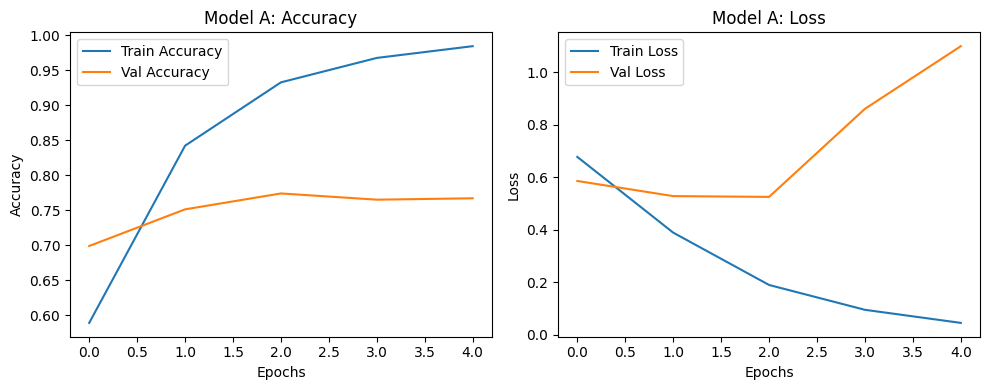

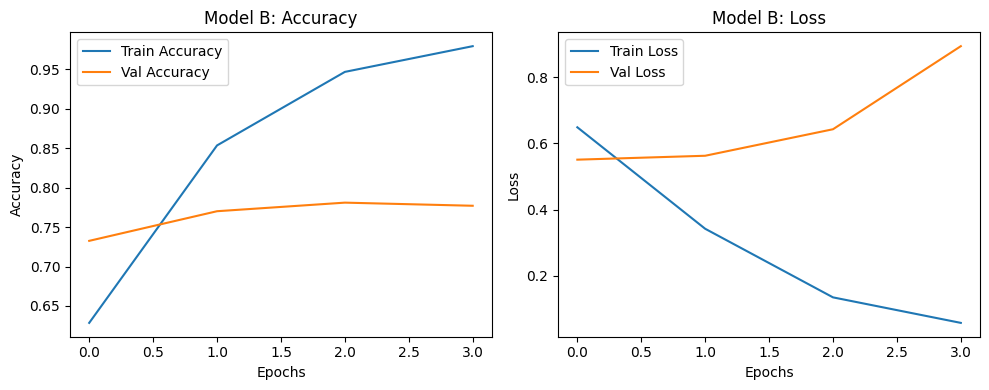

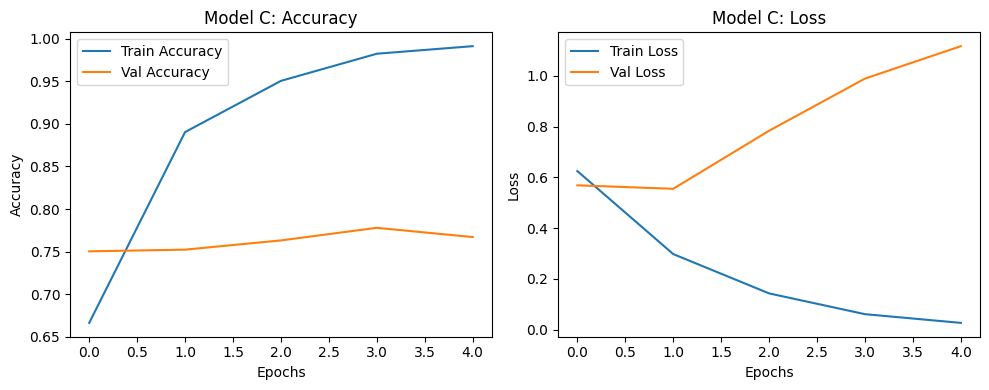

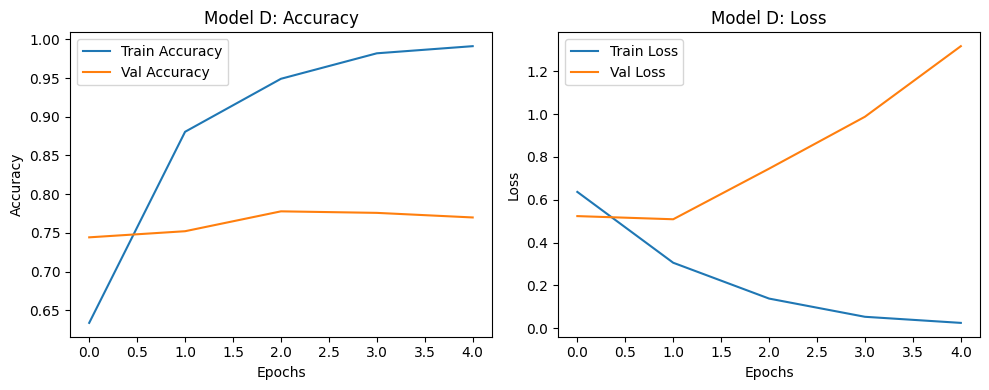

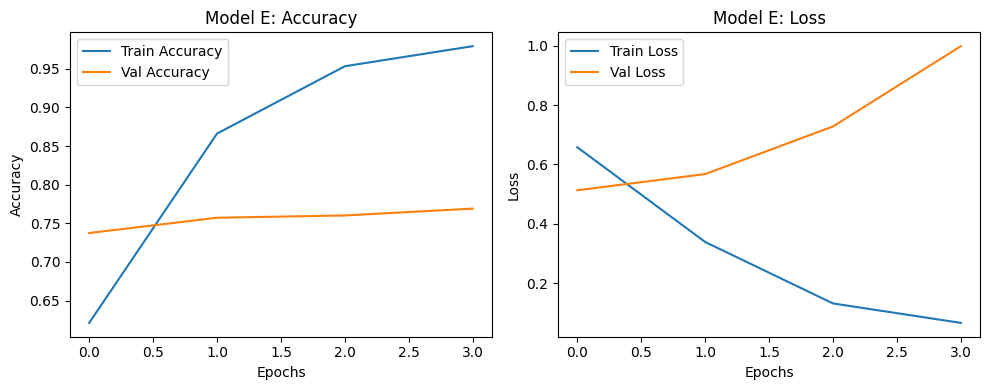

In [35]:
history_results = [model_A(), model_B(), model_C(), model_D(), model_E()]

# Word Embedding feature representation

- Word Embedding + RF
  - Model fine-tuning (GridSearchCV needed)
- Word Embedding + SVM
  - Model fine-tuning (GridSearchCV needed)
- Word Embedding + Naives Bayes
  - Model fine-tuning (GridSearchCV needed)

In [36]:
# Load spaCy medium-sized English model
nlp = spacy.load("en_core_web_md")

# Function to get sentence embedding
def get_doc_vector(text):
    return nlp(text).vector

# Convert titles to embeddings
X_train_vec = np.vstack(X_train.apply(get_doc_vector))
X_val_vec = np.vstack(X_val.apply(get_doc_vector))
X_test_vec = np.vstack(X_test.apply(get_doc_vector))

print(X_train_vec[1:5])

[[-0.6665462   0.18679287  0.34045216 ... -0.13547912 -0.09278063
   0.12785062]
 [-0.638406    0.19009958  0.2788939  ...  0.00379286 -0.31564525
   0.21084979]
 [-0.73549855  0.14755985  0.11007457 ... -0.35232773  0.01493643
   0.18853472]
 [-0.6736242   0.1491605   0.10141078 ... -0.02302734  0.01710507
   0.15307175]]


In [37]:
# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}

# Initialize Random Forest
rf_classifier_vec = RandomForestClassifier(random_state=42)

# Wrap with GridSearchCV
grid_search = GridSearchCV(
    estimator=rf_classifier_vec,
    param_grid=param_grid,
    cv=3,  # 3-fold cross-validation
    scoring='accuracy',
    verbose=2,
    n_jobs=-1  # use all CPU cores
)

# Fit on training data
grid_search.fit(X_train_vec, y_train)

# Best model
best_rf_vec = grid_search.best_estimator_

# Predict on test data
y_test_pred = best_rf_vec.predict(X_test_vec)

# Evaluate
accuracy = accuracy_score(y_test, y_test_pred)
print("Best Parameters:", grid_search.best_params_)
print("Test Accuracy:", accuracy)
print(classification_report(y_test, y_test_pred))

Fitting 3 folds for each of 96 candidates, totalling 288 fits
Best Parameters: {'bootstrap': True, 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Test Accuracy: 0.7781065088757396
              precision    recall  f1-score   support

    NEGATIVE       0.79      0.64      0.71       425
    POSITIVE       0.77      0.88      0.82       589

    accuracy                           0.78      1014
   macro avg       0.78      0.76      0.76      1014
weighted avg       0.78      0.78      0.77      1014



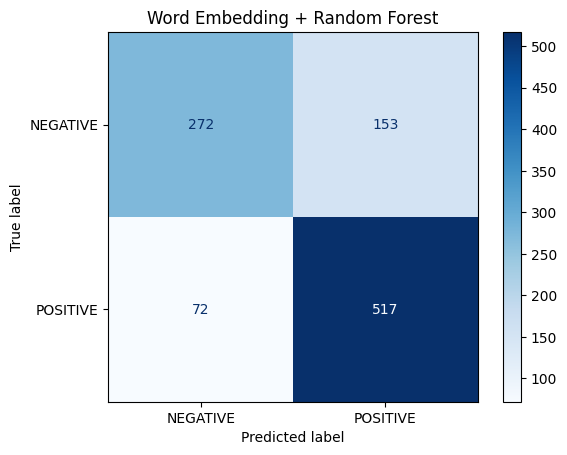

In [38]:
cm = confusion_matrix(y_test, y_test_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_rf_vec.classes_)
disp.plot(cmap=plt.cm.Blues)
disp.ax_.set_title("Word Embedding + Random Forest")
plt.show()

In [39]:
# Parameter grid to search
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],  # Linear and RBF kernels
    'gamma': ['scale', 'auto']   # Only relevant for RBF
}

# Initialize the base SVC model
svm_classifier_vec = SVC(random_state=42)

# Wrap with GridSearchCV
grid_search = GridSearchCV(
    estimator=svm_classifier,
    param_grid=param_grid,
    scoring='accuracy',
    cv=3,           # 3-fold cross-validation
    verbose=2,
    n_jobs=-1       # use all CPU cores
)

# Fit to training data
grid_search.fit(X_train_vec, y_train)

# Get best model
best_svm_rec = grid_search.best_estimator_

# Predict on test set
y_test_pred = best_svm_rec.predict(X_test_vec)

# Evaluate
accuracy = accuracy_score(y_test, y_test_pred)
print("Best Parameters:", grid_search.best_params_)
print("Test Accuracy:", accuracy)
print(classification_report(y_test, y_test_pred))


Fitting 3 folds for each of 12 candidates, totalling 36 fits
Best Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Test Accuracy: 0.7978303747534516
              precision    recall  f1-score   support

    NEGATIVE       0.76      0.76      0.76       425
    POSITIVE       0.83      0.83      0.83       589

    accuracy                           0.80      1014
   macro avg       0.79      0.79      0.79      1014
weighted avg       0.80      0.80      0.80      1014



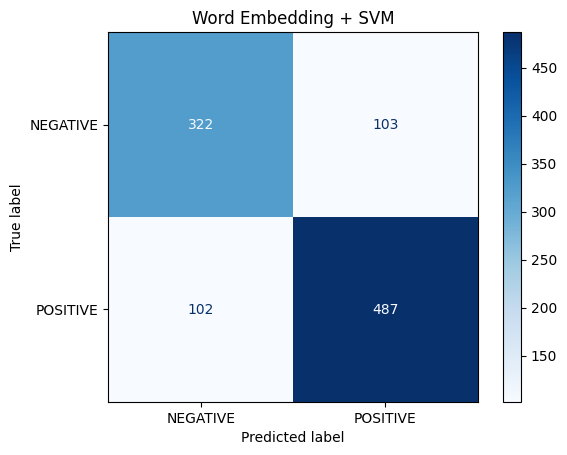

In [40]:
# ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_test_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_svm_rec.classes_)
disp.plot(cmap=plt.cm.Blues)
disp.ax_.set_title("Word Embedding + SVM")
plt.show()

The error for Naive Bayes: The error occurs when fitting the MultinomialNB model using grid_search.fit(X_train_vec, y_train). The traceback indicates a ValueError: Negative values in data passed to MultinomialNB (input X).

This error arises because MultinomialNB expects non-negative input features, but X_train_vec (which likely contains word embeddings generated by spaCy) contains negative values.

The suggested changes:
- Switch to a Different Classifier: If you want to use word embeddings as features, consider switching to a classifier that is more suitable for continuous data. Random Forest, or Support Vector Machines (SVM) are generally compatible with continuous data.

- Transform Word Embeddings: If you have a specific reason for using MultinomialNB and you want to keep word embeddings, you can transform them to be non-negative. A common approach is to apply a scaling or normalization technique. (chose this one)

In [41]:
# Initialize the scaler
scaler = MinMaxScaler()

# Fit and transform the data
X_train_vec_scaled = scaler.fit_transform(X_train_vec)
X_test_vec_scaled = scaler.transform(X_test_vec)

from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

# Parameter grid for smoothing parameter alpha
param_grid = {
    'alpha': [0.1, 0.5, 1.0, 2.0, 5.0],
    'fit_prior': [True, False]
}

# Initialize the base Naive Bayes model
nb_classifier_vec = MultinomialNB()

# Wrap with GridSearchCV
grid_search = GridSearchCV(
    estimator=nb_classifier,
    param_grid=param_grid,
    scoring='accuracy',
    cv=3,            # 3-fold cross-validation
    verbose=2,
    n_jobs=-1        # Use all CPU cores
)

# Fit to training data
grid_search.fit(X_train_vec_scaled, y_train)

# Get best model
best_nb_vec = grid_search.best_estimator_

# Predict on test set
y_test_pred = best_nb_vec.predict(X_test_vec_scaled)

# Evaluate
accuracy = accuracy_score(y_test, y_test_pred)
print("Best Parameters:", grid_search.best_params_)
print("Test Accuracy:", accuracy)
print(classification_report(y_test, y_test_pred))

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Parameters: {'alpha': 0.1, 'fit_prior': False}
Test Accuracy: 0.6380670611439843
              precision    recall  f1-score   support

    NEGATIVE       0.56      0.62      0.59       425
    POSITIVE       0.70      0.65      0.68       589

    accuracy                           0.64      1014
   macro avg       0.63      0.64      0.63      1014
weighted avg       0.64      0.64      0.64      1014



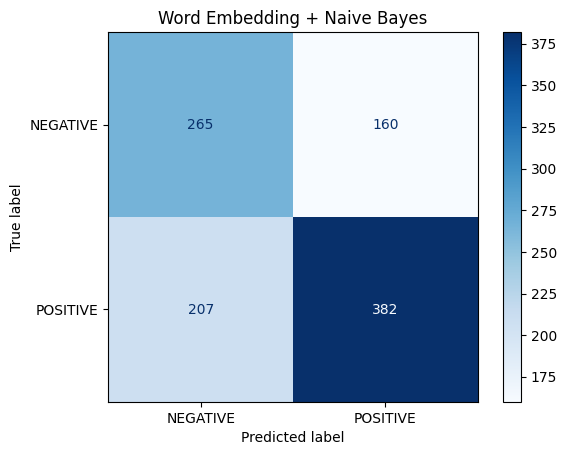

In [42]:
cm = confusion_matrix(y_test, y_test_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_nb_vec.classes_)
disp.plot(cmap=plt.cm.Blues)
disp.ax_.set_title("Word Embedding + Naive Bayes")
plt.show()

# BERT model

In [43]:
# Load pre-trained BERT model and tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Function to get BERT embeddings
def get_bert_embeddings(texts):
    encoded_input = tokenizer(texts, padding=True, truncation=True, return_tensors='pt')
    with torch.no_grad():
        output = model(**encoded_input)
    return output.last_hidden_state[:, 0, :].numpy()  # Use [CLS] token embeddings

# Generate BERT embeddings
X_train_bert = get_bert_embeddings(X_train.tolist())
X_val_bert = get_bert_embeddings(X_val.tolist())
X_test_bert = get_bert_embeddings(X_test.tolist())

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [44]:
#Random Forest
# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}

# Initialize Random Forest
rf_classifier_bert = RandomForestClassifier(random_state=42)

# Wrap with GridSearchCV
grid_search = GridSearchCV(
    estimator=rf_classifier_bert,
    param_grid=param_grid,
    cv=3,  # 3-fold cross-validation
    scoring='accuracy',
    verbose=2,
    n_jobs=-1  # use all CPU cores
)

# Fit on training data
grid_search.fit(X_train_bert, y_train)

# Best model
best_rf_clf = grid_search.best_estimator_

# Predict on test data
y_pred_rf = best_rf_clf.predict(X_test_bert)

# Evaluate
accuracy = accuracy_score(y_test, y_test_pred)
print("Best Parameters:", grid_search.best_params_)
print("Test Accuracy:", accuracy)
print(classification_report(y_test, y_pred_rf))


Fitting 3 folds for each of 96 candidates, totalling 288 fits
Best Parameters: {'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
Test Accuracy: 0.6380670611439843
              precision    recall  f1-score   support

    NEGATIVE       0.81      0.72      0.76       425
    POSITIVE       0.81      0.88      0.84       589

    accuracy                           0.81      1014
   macro avg       0.81      0.80      0.80      1014
weighted avg       0.81      0.81      0.81      1014



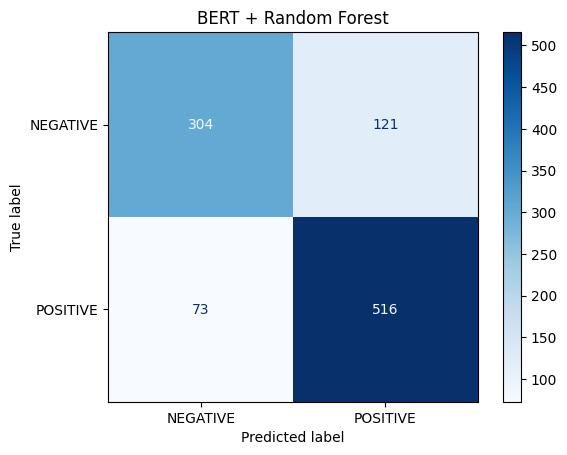

In [45]:
cm = confusion_matrix(y_test, y_pred_rf)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_rf_clf.classes_)
disp.plot(cmap=plt.cm.Blues)
disp.ax_.set_title("BERT + Random Forest")
plt.show()

In [46]:
# Train SVM
# Parameter grid to search
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],  # Linear and RBF kernels
    'gamma': ['scale', 'auto']   # Only relevant for RBF
}

# Initialize the base SVC model
svm_classifier_bert = SVC(random_state=42)

# Wrap with GridSearchCV
grid_search = GridSearchCV(
    estimator=svm_classifier_bert,
    param_grid=param_grid,
    scoring='accuracy',
    cv=3,           # 3-fold cross-validation
    verbose=2,
    n_jobs=-1       # use all CPU cores
)

# Fit to training data
grid_search.fit(X_train_bert, y_train)

# Get best model
best_svm_clf = grid_search.best_estimator_

# Predict on test set
y_pred_svm = best_svm_clf.predict(X_test_bert)

# Evaluate
accuracy = accuracy_score(y_test, y_test_pred)
print("Best Parameters:", grid_search.best_params_)
print("Test Accuracy:", accuracy)
print(classification_report(y_test, y_pred_svm))

Fitting 3 folds for each of 12 candidates, totalling 36 fits
Best Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Test Accuracy: 0.6380670611439843
              precision    recall  f1-score   support

    NEGATIVE       0.76      0.78      0.77       425
    POSITIVE       0.84      0.82      0.83       589

    accuracy                           0.80      1014
   macro avg       0.80      0.80      0.80      1014
weighted avg       0.80      0.80      0.80      1014



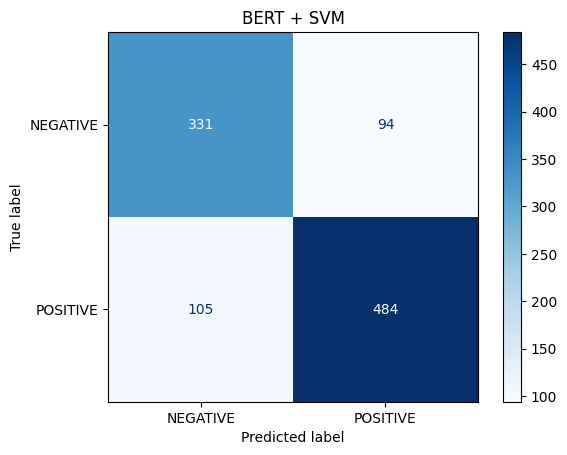

In [47]:
cm = confusion_matrix(y_test, y_pred_svm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_rf_clf.classes_)
disp.plot(cmap=plt.cm.Blues)
disp.ax_.set_title("BERT + SVM")
plt.show()

In [48]:
# Function to get BERT embeddings
def get_bert_embeddings(texts):
    encoded_input = tokenizer(texts, padding=True, truncation=True, return_tensors='pt')
    with torch.no_grad():
        output = model(**encoded_input)
    return output.last_hidden_state[:, 0, :].numpy()


# Generate BERT embeddings for X_test
X_test_bert = get_bert_embeddings(X_test.tolist())


# Predict using the best RandomForestClassifier trained with BERT embeddings
predicted_label_BERT = best_rf_clf.predict(X_test_bert)

# Create a DataFrame with RF model
df_bert_predictions = pd.DataFrame({'Cleaned_titles': X_test, 'predicted_label_BERT_rf': predicted_label_BERT})
#df_bert_predictions = pd.DataFrame({'Cleaned_titles': X_test, 'predicted_label_BERT_rf': [x.lower() for x in predicted_label_BERT]})
df_bert_predictions.head()


#Create a DataFrame with SVM model
predicted_label_BERT_svm = best_svm_clf.predict(X_test_bert)
df_bert_predictions_svm = pd.DataFrame({'Cleaned_titles': X_test, 'predicted_label_BERT_svm': predicted_label_BERT_svm})
df_bert_predictions_svm.head()

,Cleaned_titles,predicted_label_BERT_svm
2830,investor patience rewarded atampt stock,POSITIVE
2327,hedge fund right svb financial group sivb,NEGATIVE
2488,nasdaq nasdaqndaq shareholder earned 19 cagr l...,NEGATIVE
2888,netflix go tollywood beyond longsought india g...,POSITIVE
2615,apple prepares unveil new ipad pro imac airtag...,NEGATIVE


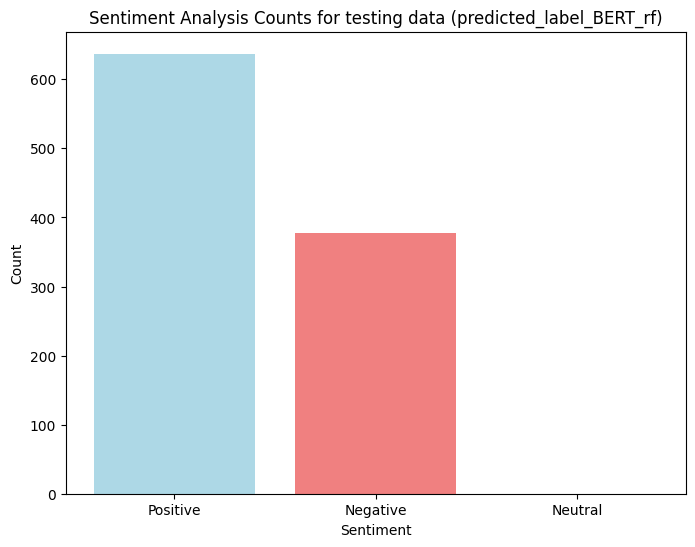

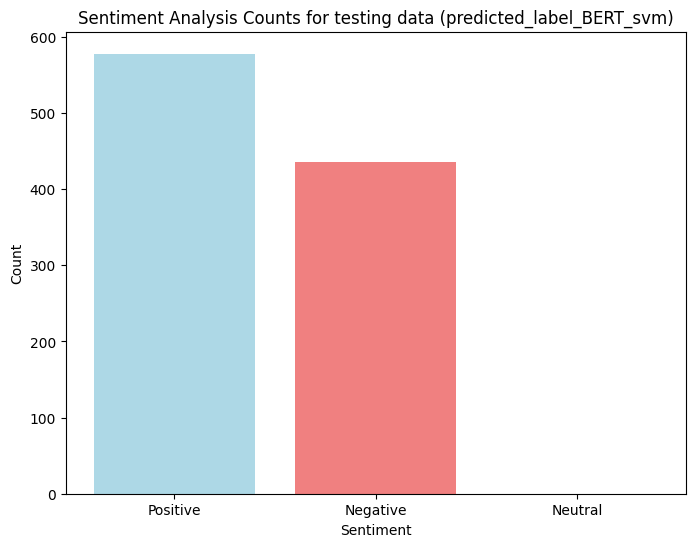

In [49]:
def plot_sentiment_counts(df, column_name):
    positive_count = (df[column_name] == 'POSITIVE').sum()
    negative_count = (df[column_name] == 'NEGATIVE').sum()
    neutral_count = (df[column_name] == 'NEUTRAL').sum()

    labels = ['Positive', 'Negative', 'Neutral']
    counts = [positive_count, negative_count, neutral_count]

    plt.figure(figsize=(8, 6))
    plt.bar(labels, counts, color=['lightblue', 'lightcoral', 'lightgreen'])
    plt.xlabel('Sentiment')
    plt.ylabel('Count')
    plt.title(f'Sentiment Analysis Counts for testing data ({column_name})')
    plt.show()

plot_sentiment_counts(df_bert_predictions, 'predicted_label_BERT_rf')
plot_sentiment_counts(df_bert_predictions_svm, 'predicted_label_BERT_svm')

# FinBERT model

In [50]:
# Load FinBERT
tokenizer = AutoTokenizer.from_pretrained("yiyanghkust/finbert-tone")
model = AutoModel.from_pretrained("yiyanghkust/finbert-tone")

def get_finbert_embedding(texts):
    model.eval()
    embeddings = []
    with torch.no_grad():
        for text in texts:
            inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=64)
            outputs = model(**inputs)
            # Use CLS token as sentence embedding
            cls_embedding = outputs.last_hidden_state[:, 0, :].squeeze().numpy()
            embeddings.append(cls_embedding)
    return np.array(embeddings)

# Generate FinBERT embeddings
X_train_embed = get_finbert_embedding(X_train)
X_val_embed = get_finbert_embedding(X_val)
X_test_embed = get_finbert_embedding(X_test)

config.json:   0%|          | 0.00/533 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/226k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/439M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/439M [00:00<?, ?B/s]

In [51]:
#Random Forest
# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}

# Initialize Random Forest
rf_clf = RandomForestClassifier(random_state=42)

# Wrap with GridSearchCV
grid_search = GridSearchCV(
    estimator=rf_clf,
    param_grid=param_grid,
    cv=3,  # 3-fold cross-validation
    scoring='accuracy',
    verbose=2,
    n_jobs=-1  # use all CPU cores
)

# Fit on training data
grid_search.fit(X_train_embed, y_train)

# Best model
best_rf_clf = grid_search.best_estimator_

# Predict on test data
y_test_pred_rf = best_rf_clf.predict(X_test_embed)

# Evaluate
accuracy = accuracy_score(y_test, y_test_pred)
print("Best Parameters:", grid_search.best_params_)
print("Test Accuracy:", accuracy)
print(classification_report(y_test, y_test_pred_rf))

Fitting 3 folds for each of 96 candidates, totalling 288 fits
Best Parameters: {'bootstrap': False, 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 50}
Test Accuracy: 0.6380670611439843
              precision    recall  f1-score   support

    NEGATIVE       0.76      0.71      0.73       425
    POSITIVE       0.80      0.84      0.82       589

    accuracy                           0.78      1014
   macro avg       0.78      0.77      0.77      1014
weighted avg       0.78      0.78      0.78      1014



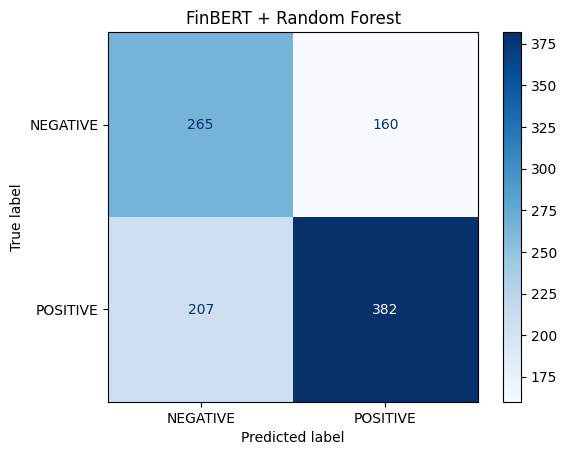

In [52]:
cm = confusion_matrix(y_test, y_test_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_rf_clf.classes_)
disp.plot(cmap=plt.cm.Blues)
disp.ax_.set_title("FinBERT + Random Forest")
plt.show()

In [53]:
# Train SVM
# Parameter grid to search
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],  # Linear and RBF kernels
    'gamma': ['scale', 'auto']   # Only relevant for RBF
}

# Initialize the base SVC model
svm_clf = SVC(random_state=42)

# Wrap with GridSearchCV
grid_search = GridSearchCV(
    estimator=svm_clf,
    param_grid=param_grid,
    scoring='accuracy',
    cv=3,           # 3-fold cross-validation
    verbose=2,
    n_jobs=-1       # use all CPU cores
)

# Fit to training data
grid_search.fit(X_train_embed, y_train)

# Get best model
best_svm_clf = grid_search.best_estimator_

# Predict on test set
y_test_pred_svm = best_svm_clf.predict(X_test_embed)

# Evaluate
accuracy = accuracy_score(y_test, y_test_pred)
print("Best Parameters:", grid_search.best_params_)
print("Test Accuracy:", accuracy)
print(classification_report(y_test, y_test_pred_svm))

Fitting 3 folds for each of 12 candidates, totalling 36 fits
Best Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Test Accuracy: 0.6380670611439843
              precision    recall  f1-score   support

    NEGATIVE       0.76      0.73      0.74       425
    POSITIVE       0.81      0.83      0.82       589

    accuracy                           0.79      1014
   macro avg       0.78      0.78      0.78      1014
weighted avg       0.79      0.79      0.79      1014



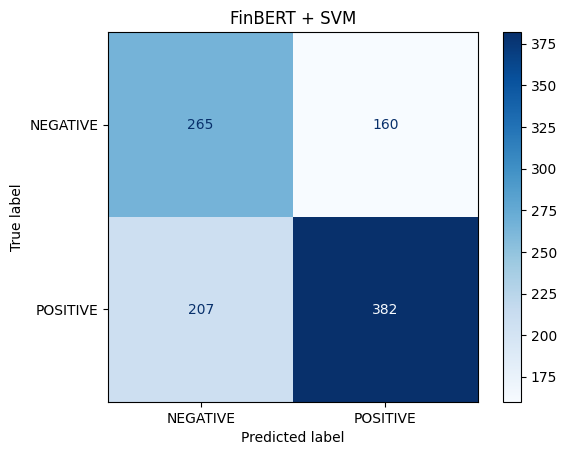

In [54]:
cm = confusion_matrix(y_test, y_test_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_svm_clf.classes_)
disp.plot(cmap=plt.cm.Blues)
disp.ax_.set_title("FinBERT + SVM")
plt.show()

In [55]:
finbert_classifier = pipeline("text-classification", model="yiyanghkust/finbert-tone", tokenizer="yiyanghkust/finbert-tone")

# Predict on test headlines
end_to_end_preds = finbert_classifier(X_test.tolist())

# Extract labels
y_pred_end_to_end = [p['label'].lower() for p in end_to_end_preds]

print("FinBERT End-to-End Predictions:", y_pred_end_to_end)

# make a dataframe for X-test["Cleaned_titles"] and the y_pred_end_to_end
df_end_to_end = pd.DataFrame({'Cleaned_titles': X_test, 'transformer_sentiment_label': y_test.str.lower(),'FinBERT_sentiment_label': y_pred_end_to_end})

df_end_to_end.head()


Device set to use cuda:0


FinBERT End-to-End Predictions: ['positive', 'neutral', 'neutral', 'positive', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'positive', 'positive', 'neutral', 'positive', 'positive', 'neutral', 'neutral', 'positive', 'neutral', 'neutral', 'positive', 'positive', 'neutral', 'neutral', 'neutral', 'positive', 'neutral', 'neutral', 'positive', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'positive', 'positive', 'positive', 'neutral', 'neutral', 'neutral', 'positive', 'neutral', 'neutral', 'neutral', 'neutral', 'positive', 'positive', 'neutral', 'neutral', 'positive', 'neutral', 'neutral', 'positive', 'neutral', 'neutral', 'neutral', 'positive', 'neutral', 'positive', 'neutral', 'neutral', 'neutral', 'positive', 'neutral', 'neutral', 'positive', 'positive', 'neutral', 'positive', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'positive', 'neutral', 'neutral', 'negative', 'neutral', 'neutral', 'neutral', 'positive', 'positive', 'neutral', 'po

,Cleaned_titles,transformer_sentiment_label,FinBERT_sentiment_label
2830,investor patience rewarded atampt stock,positive,positive
2327,hedge fund right svb financial group sivb,negative,neutral
2488,nasdaq nasdaqndaq shareholder earned 19 cagr l...,negative,neutral
2888,netflix go tollywood beyond longsought india g...,positive,positive
2615,apple prepares unveil new ipad pro imac airtag...,positive,neutral


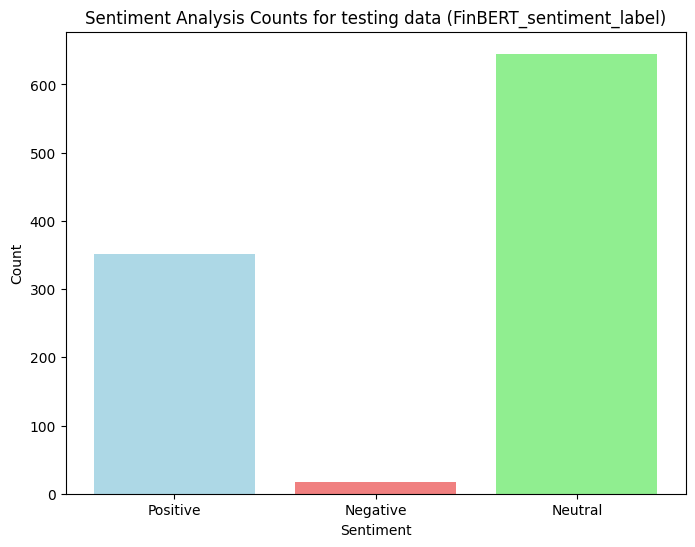

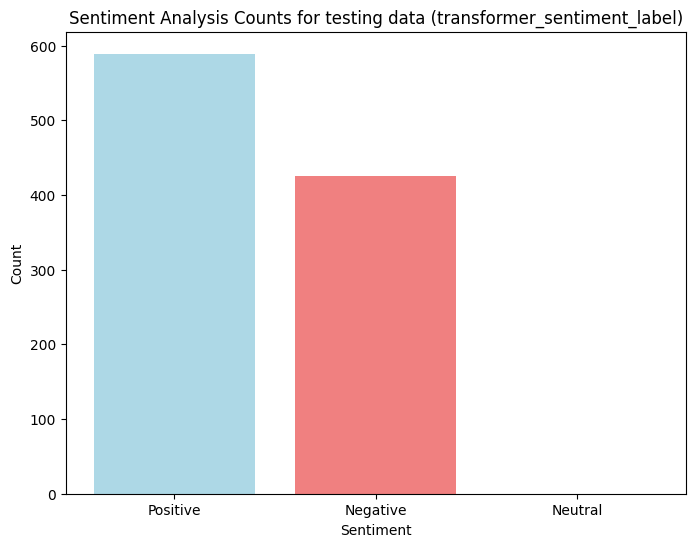

In [56]:
def plot_sentiment_counts(df, column_name):
    positive_count = (df[column_name] == 'positive').sum()
    negative_count = (df[column_name] == 'negative').sum()
    neutral_count = (df[column_name] == 'neutral').sum()

    labels = ['Positive', 'Negative', 'Neutral']
    counts = [positive_count, negative_count, neutral_count]

    plt.figure(figsize=(8, 6))
    plt.bar(labels, counts, color=['lightblue', 'lightcoral', 'lightgreen'])
    plt.xlabel('Sentiment')
    plt.ylabel('Count')
    plt.title(f'Sentiment Analysis Counts for testing data ({column_name})')
    plt.show()


plot_sentiment_counts(df_end_to_end, 'FinBERT_sentiment_label')
plot_sentiment_counts(df_end_to_end, 'transformer_sentiment_label')


# Future Research

In [57]:
# finbert model using a labeled training data with senitment score

from transformers import AutoTokenizer, TFAutoModelForSequenceClassification
import tensorflow as tf

# Load the FinBERT tokenizer and model
tokenizer = AutoTokenizer.from_pretrained("ProsusAI/finbert")
model = TFAutoModelForSequenceClassification.from_pretrained("ProsusAI/finbert")

# Assuming 'single_headlines_df1' is your DataFrame and 'Cleaned_titles' is the column
# with the cleaned text and 'sentiment_label' is your target variable
X_train = train_df['Cleaned_titles'].tolist()
y_train = train_df['sentiment_label'].tolist()
X_val = val_df['Cleaned_titles'].tolist()
y_val = val_df['sentiment_label'].tolist()

# Convert sentiment labels to numerical values
label_mapping = {"POSITIVE": 1, "NEGATIVE": 0, "NEUTRAL": 2}  # Example mapping
y_train_encoded = [label_mapping[label] for label in y_train]
y_val_encoded = [label_mapping[label] for label in y_val]


# Tokenize the training and validation data
train_encodings = tokenizer(X_train, truncation=True, padding=True)
val_encodings = tokenizer(X_val, truncation=True, padding=True)


# Create TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings),
    y_train_encoded
))
val_dataset = tf.data.Dataset.from_tensor_slices((
    dict(val_encodings),
    y_val_encoded
))


# Compile and train the model
#Instead of passing optimizer object, pass 'adam' string
model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])


history = model.fit(train_dataset.shuffle(1000).batch(16), epochs=10, batch_size=16, validation_data=val_dataset.batch(16))


# Make predictions on the test set
X_test = test_df['Cleaned_titles'].tolist()
test_encodings = tokenizer(X_test, truncation=True, padding=True)

# Create a TensorFlow Dataset for prediction
test_dataset = tf.data.Dataset.from_tensor_slices(dict(test_encodings)).batch(16) #batch size should be same as training

# Get predictions using the TensorFlow Dataset
predictions = model.predict(test_dataset)
predicted_labels = tf.argmax(predictions.logits, axis=1).numpy()


# Evaluate the model (Example: Accuracy)
# Assuming you have the true labels in y_test_encoded
y_test_encoded = [label_mapping[label] for label in y_test]

accuracy = tf.keras.metrics.Accuracy()
accuracy.update_state(y_test_encoded, predicted_labels)
print(f"Test Accuracy: {accuracy.result().numpy()}")

tokenizer_config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/758 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


tf_model.h5:   0%|          | 0.00/438M [00:00<?, ?B/s]

All model checkpoint layers were used when initializing TFBertForSequenceClassification.

Some layers of TFBertForSequenceClassification were not initialized from the model checkpoint at ProsusAI/finbert and are newly initialized: ['classifier']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/10
190/190 [==============================] - 79s 193ms/step - loss: 0.7384 - accuracy: 0.5069 - val_loss: 0.6999 - val_accuracy: 0.5301
Epoch 2/10
190/190 [==============================] - 33s 174ms/step - loss: 0.7108 - accuracy: 0.5191 - val_loss: 0.6916 - val_accuracy: 0.5301
Epoch 3/10
190/190 [==============================] - 33s 176ms/step - loss: 0.7341 - accuracy: 0.4997 - val_loss: 0.6918 - val_accuracy: 0.5301
Epoch 4/10
190/190 [==============================] - 34s 177ms/step - loss: 0.7310 - accuracy: 0.5161 - val_loss: 0.7113 - val_accuracy: 0.4699
Epoch 5/10
190/190 [==============================] - 34s 179ms/step - loss: 0.7292 - accuracy: 0.5059 - val_loss: 0.6995 - val_accuracy: 0.5301
Epoch 6/10
190/190 [==============================] - 34s 180ms/step - loss: 0.7185 - accuracy: 0.5066 - val_loss: 0.6922 - val_accuracy: 0.5301
Epoch 7/10
190/190 [==============================] - 34s 179ms/step - loss: 0.7503 - accuracy: 0.5105 - val_loss: 0.7025 - val_ac

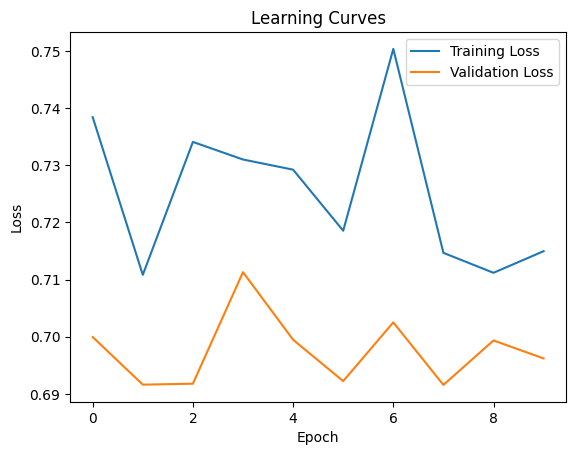

In [58]:
import matplotlib.pyplot as plt
def plot_learning_curves(loss, val_loss):
  plt.plot(loss, label='Training Loss')
  plt.plot(val_loss, label='Validation Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend()
  plt.title('Learning Curves')
  plt.show()

plot_learning_curves(history.history["loss"], history.history["val_loss"])